#**Rotación del conejito**

In [2]:
import os
from google.colab import drive
drive.mount('/content/drive')
os.chdir('/content/drive/MyDrive/PROYECTO DE GRADO/Code')
!pwd

Mounted at /content/drive
/content/drive/.shortcut-targets-by-id/1asBEAN-S2b77S-W1swprmpEcUXwsqzS3/PROYECTO DE GRADO/Code


In [1]:
!pip install plyfile

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
from plyfile import PlyData, PlyElement #Libreria para almacenar datos tridimensionales de escáneres 3D. 
import numpy as np
import cv2 #Librería para problemas de visión por computador
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
import pandas as pd
import tensorflow as tf
from sklearn.datasets import make_blobs
from sklearn.model_selection import train_test_split
import gc

In [4]:
gc.collect() #borra la basura acumulada en RAM

75

In [53]:
plydata = PlyData.read('Data/bunny/data/bun315.ply')

/usr/local/lib/python3.7/dist-packages/plyfile.py:918: UserWarning: loadtxt: Empty input file: "[]"
  data = _np.loadtxt(list(_islice(fields, n)), val_t, ndmin=1)


Exploración de los datos del conejito

In [54]:
plydata.elements[0].data

array([(-0.00325, 0.0343297, 0.0776036 ),
       (-0.00275, 0.034384 , 0.0780838 ),
       (-0.00225, 0.0344112, 0.0783238 ), ...,
       (-0.00875, 0.186921 , 0.00684822),
       (-0.00825, 0.186919 , 0.00722878),
       (-0.00775, 0.186918 , 0.00748249)],
      dtype=[('x', '<f4'), ('y', '<f4'), ('z', '<f4')])

Extraemos solo las coordenadas en X, Y y Z del conejito

In [55]:
points = []
for point in plydata.elements[0].data:
    points.append([point['x'], point['y'], point['z']])
points = np.array(points)


In [56]:
print(points.shape)
print(points[0:-1:2].shape)

(35336, 3)
(17668, 3)


Centramos el conejito en el origen

In [57]:
ptts = points-np.mean(points,0)

In [58]:
ptts[0]

array([-0.00732267, -0.06134854,  0.01734922], dtype=float32)

In [59]:
type(ptts)

numpy.ndarray

Una vez centrado, imprimimos el conejito desde diferentes vistas

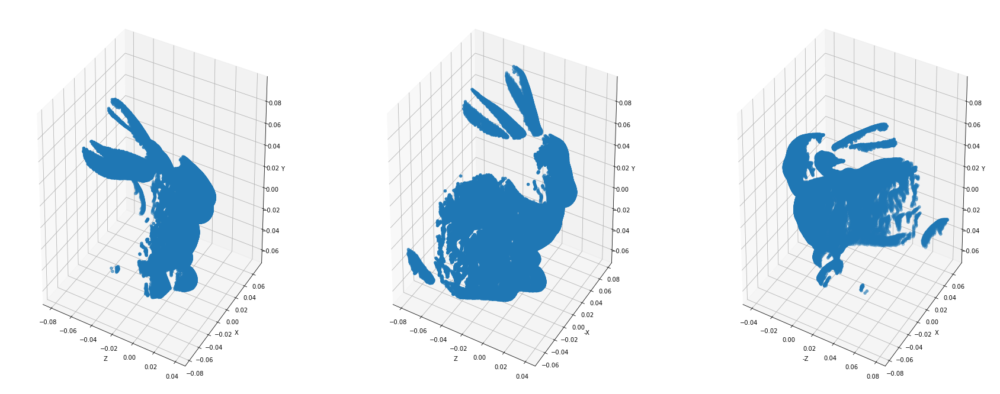

In [60]:
fig = plt.figure(figsize=(30,12))


ax = fig.add_subplot(1, 3, 1, projection='3d')
X = ptts[:,0]
Y = ptts[:,1]
Z = ptts[:,2]

ax.scatter3D(Z,X,Y)
ax.set_xlabel('Z')
ax.set_ylabel('X')
ax.set_zlabel('Y')


ax = fig.add_subplot(1, 3, 2, projection='3d')
X = ptts[:,0]
Y = ptts[:,1]
Z = ptts[:,2]

ax.scatter3D(Z,-X,Y)
ax.set_xlabel('Z')
ax.set_ylabel('-X')
ax.set_zlabel('Y')


ax = fig.add_subplot(1, 3, 3, projection='3d')
X = ptts[:,0]
Y = ptts[:,1]
Z = ptts[:,2]
ax.scatter3D(-Z,X,Y)
ax.set_xlabel('-Z')
ax.set_ylabel('X')
ax.set_zlabel('Y')

plt.show()

##Funciones de rotación:

In [ ]:
def X_axis_rotation_matrix(theta):
    return np.array([[1,             0,              0],
                     [0, np.cos(theta), -np.sin(theta)],
                     [0, np.sin(theta),  np.cos(theta)]])

In [ ]:
def Y_axis_rotation_matrix(theta):
    return np.array([[np.cos(theta),  0,  np.sin(theta)],
                     [0,              1,              0],
                     [-np.sin(theta), 0,  np.cos(theta)]])

In [ ]:
def Z_axis_rotation_matrix(theta):
    return np.array([[np.cos(theta),   -np.sin(theta),    0],
                     [np.sin(theta),    np.cos(theta),    0],
                     [0,                0,                1]])

Convertimos Points, que contiene las coordenadas del conejito sin centrar, a numpy array.

In [ ]:
points=np.asarray(points.astype(float)) 

#points era una lista, ahora es numpy array, su diferencia con ptts es que ptts está centrada en el origen y points no

##Rotación con respecto a X:

In [ ]:
#Rotacion en X
rotation=np.pi/2 #90 grados
R = X_axis_rotation_matrix(rotation)

#Esta es la operación realizada para rotar al conejito (debe estár centrado en el origen porque lo que se rotan son los ejes coordenados)
ptts = np.dot(R, points.T).T

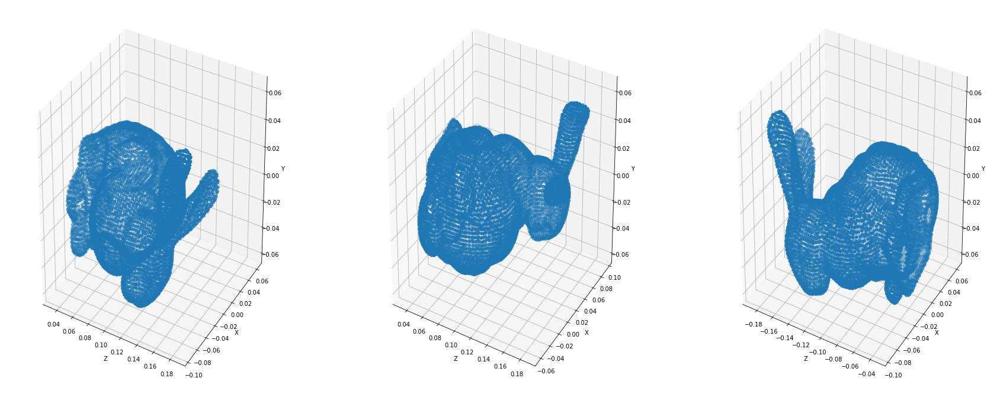

In [ ]:
fig = plt.figure(figsize=(30,12))


ax = fig.add_subplot(1, 3, 1, projection='3d')
X = ptts[:,0]
Y = ptts[:,1]
Z = ptts[:,2]
ax.scatter3D(Z,X,Y)
ax.set_xlabel('Z')
ax.set_ylabel('X')
ax.set_zlabel('Y')


ax = fig.add_subplot(1, 3, 2, projection='3d')
X = ptts[:,0]
Y = ptts[:,1]
Z = ptts[:,2]
ax.scatter3D(Z,-X,Y)
ax.set_xlabel('Z')
ax.set_ylabel('X')
ax.set_zlabel('Y')


ax = fig.add_subplot(1, 3, 3, projection='3d')
X = ptts[:,0]
Y = ptts[:,1]
Z = ptts[:,2]
ax.scatter3D(-Z,X,Y)
ax.set_xlabel('Z')
ax.set_ylabel('X')
ax.set_zlabel('Y')

plt.show()

##Rotación con respecto a Y:

In [ ]:
#Rotacion en Y
R = Y_axis_rotation_matrix(rotation)
ptts = np.dot(R, points.T).T

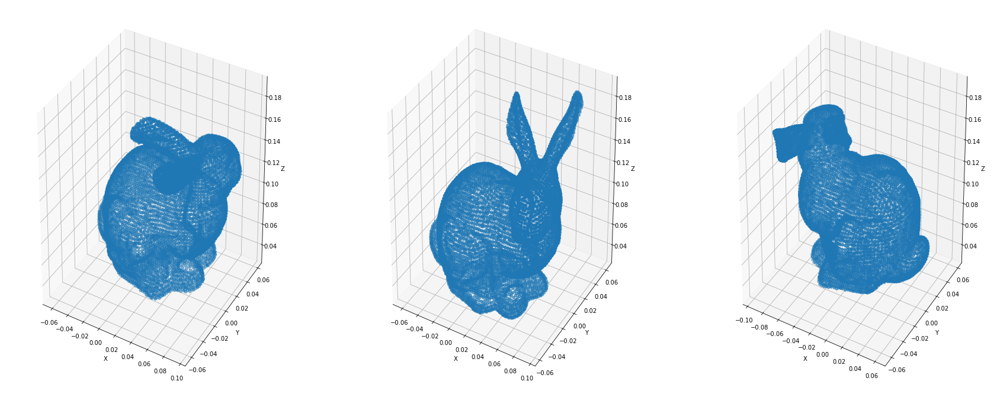

In [ ]:
fig = plt.figure(figsize=(30,12))


ax = fig.add_subplot(1, 3, 1, projection='3d')
X = ptts[:,0]
Y = ptts[:,1]
Z = ptts[:,2]
ax.scatter3D(Z,X,Y)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')


ax = fig.add_subplot(1, 3, 2, projection='3d')
X = ptts[:,0]
Y = ptts[:,1]
Z = ptts[:,2]
ax.scatter3D(Z,-X,Y)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')


ax = fig.add_subplot(1, 3, 3, projection='3d')
X = ptts[:,0]
Y = ptts[:,1]
Z = ptts[:,2]
ax.scatter3D(-Z,X,Y)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

plt.show()

##Rotación con respecto a Z:

In [ ]:
#Rotacion en Z
R = Z_axis_rotation_matrix(rotation)
ptts = np.dot(R, points.T).T

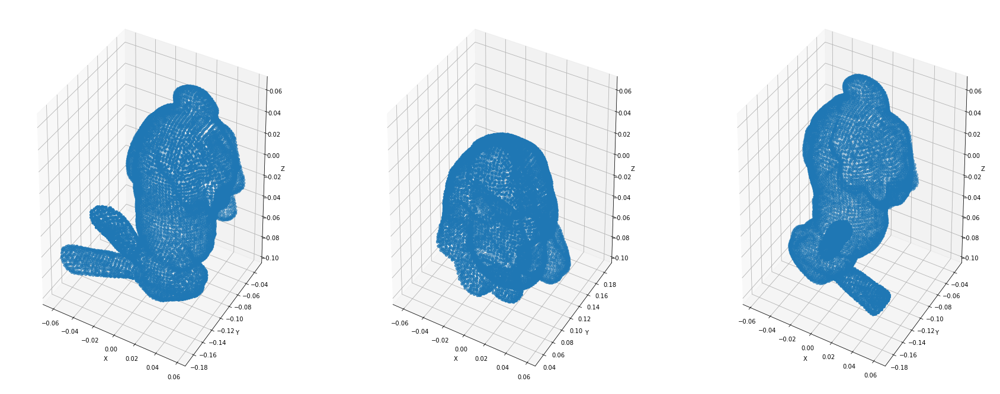

In [ ]:
fig = plt.figure(figsize=(30,12))


ax = fig.add_subplot(1, 3, 1, projection='3d')
X = ptts[:,0]
Y = ptts[:,1]
Z = ptts[:,2]
ax.scatter3D(Z,X,Y)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')


ax = fig.add_subplot(1, 3, 2, projection='3d')
X = ptts[:,0]
Y = ptts[:,1]
Z = ptts[:,2]
ax.scatter3D(Z,-X,Y)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')


ax = fig.add_subplot(1, 3, 3, projection='3d')
X = ptts[:,0]
Y = ptts[:,1]
Z = ptts[:,2]
ax.scatter3D(-Z,X,Y)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

plt.show()

In [ ]:
#Rotacion primero en X, luego en Y y luego en Z
rotation=np.pi/2 #90 grados
puntos=np.asarray(points.astype(float))
puntos= puntos-np.mean(puntos,0)

In [ ]:


#Rotacion en X
R = X_axis_rotation_matrix(rotation)
ptts = np.dot(R, puntos.T).T
#Rotacion en Y
R = Y_axis_rotation_matrix(rotation)
ptts = np.dot(R, ptts.T).T


#Rotacion en Z
R = Z_axis_rotation_matrix(rotation)
ptts = np.dot(R, ptts.T).T

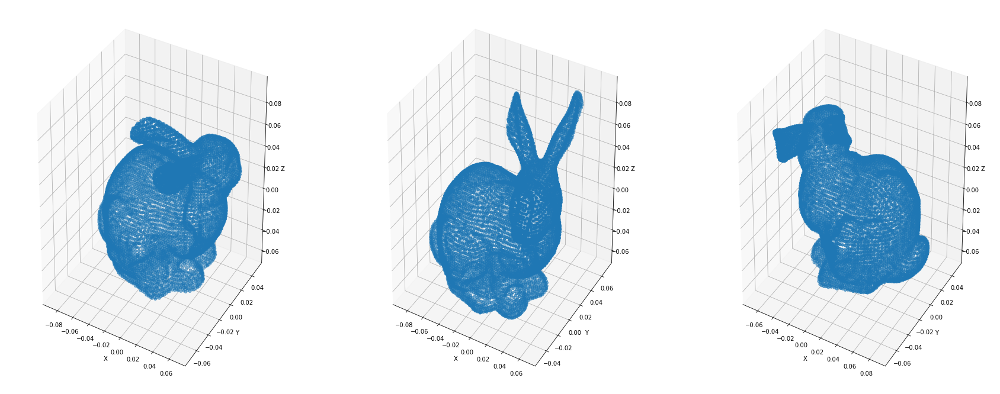

In [ ]:
fig = plt.figure(figsize=(30,12))


ax = fig.add_subplot(1, 3, 1, projection='3d')
X = ptts[:,0]
Y = ptts[:,1]
Z = ptts[:,2]
ax.scatter3D(Z,X,Y)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')


ax = fig.add_subplot(1, 3, 2, projection='3d')
X = ptts[:,0]
Y = ptts[:,1]
Z = ptts[:,2]
ax.scatter3D(Z,-X,Y)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')


ax = fig.add_subplot(1, 3, 3, projection='3d')
X = ptts[:,0]
Y = ptts[:,1]
Z = ptts[:,2]
ax.scatter3D(-Z,X,Y)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

plt.show()

In [ ]:
rotation=np.pi/2 #90 grados
puntos=np.asarray(points.astype(float))

puntos= puntos-np.mean(puntos,0)

In [ ]:
Rx = X_axis_rotation_matrix(rotation)
Ry = Y_axis_rotation_matrix(rotation)
Rz = Z_axis_rotation_matrix(rotation)


R = np.dot(Rz,Ry,Rx)
ptts = np.dot(R, puntos.T).T

In [ ]:
print(R)

[[ 3.74939946e-33 -1.00000000e+00  6.12323400e-17]
 [ 6.12323400e-17  6.12323400e-17  1.00000000e+00]
 [-1.00000000e+00  0.00000000e+00  6.12323400e-17]]


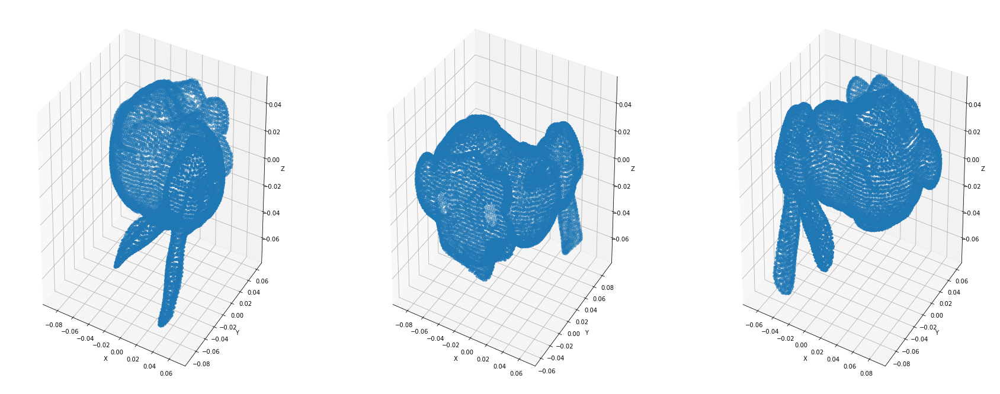

In [ ]:
fig = plt.figure(figsize=(30,12))


ax = fig.add_subplot(1, 3, 1, projection='3d')
X = ptts[:,0]
Y = ptts[:,1]
Z = ptts[:,2]
ax.scatter3D(Z,X,Y)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')


ax = fig.add_subplot(1, 3, 2, projection='3d')
X = ptts[:,0]
Y = ptts[:,1]
Z = ptts[:,2]
ax.scatter3D(Z,-X,Y)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')


ax = fig.add_subplot(1, 3, 3, projection='3d')
X = ptts[:,0]
Y = ptts[:,1]
Z = ptts[:,2]
ax.scatter3D(-Z,X,Y)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

plt.show()

#**Segmentar Parte del conejito**

In [ ]:
ptts = ptts/np.max(points) #Cogí la mitad de los puntos del conejo porque si no se explota :(

Text(0, 0.5, 'Y')

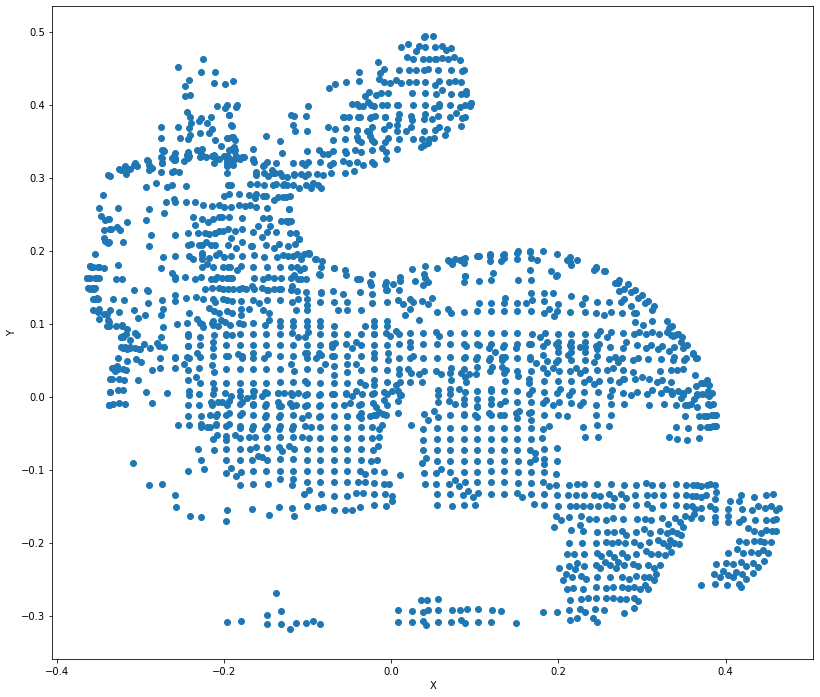

In [ ]:
#Esto no hace nada, solo grafique para ver los límites

segmento = ptts[1000:3000]

fig = plt.figure(figsize=(30,12))

#ax = fig.add_subplot(1, 2, 1, projection='3d', label='Segmento',)
ax = fig.add_subplot(1, 2, 1, label='Segmento',)
X = segmento[:,0]
Y = segmento[:,1]
Z = segmento[:,2]


#ax.scatter3D(Z,X,Y)
ax.scatter(X,Y)
ax.set_xlabel('X')
ax.set_ylabel('Y')
#ax.set_zlabel('Z')

In [ ]:
cabeza = []
for point in ptts:
  if ((point[0]<0.1)and(point[1]>0)): #Solo valores con y>0 y x<0.1
    cabeza.append(point)

cabeza = np.asarray(cabeza).astype('float32')

(3082, 3)


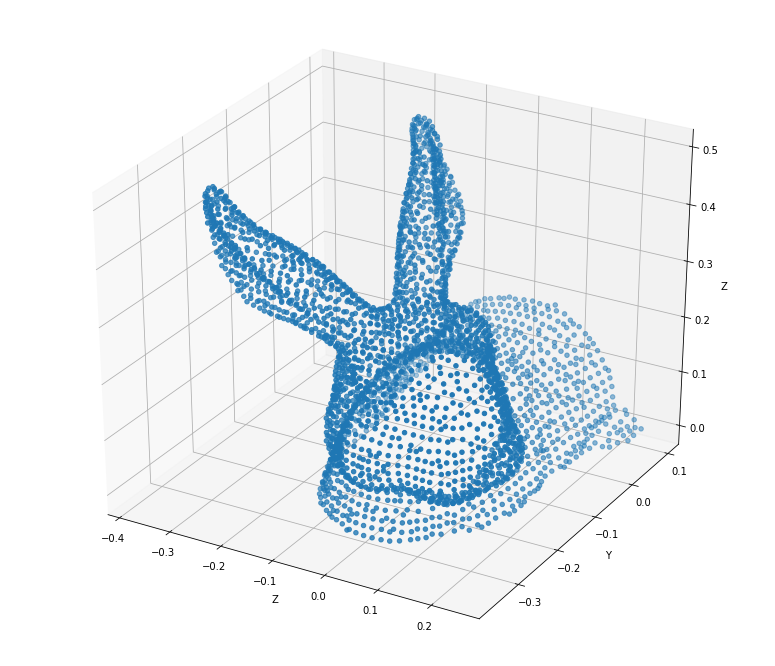

In [ ]:
fig = plt.figure(figsize=(30,12))

ax = fig.add_subplot(1, 2, 1, projection='3d', label='Segmento',)
#ax = fig.add_subplot(1, 2, 1, label='Segmento',)
X = cabeza[:,0]
Y = cabeza[:,1]
Z = cabeza[:,2]
ax.scatter3D(Z,X,Y)
#ax.scatter(Z,Y)
ax.set_xlabel('Z')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

print(cabeza.shape)

# **Dataset de conejitos rotados**

En esta celda imprimo el conejito como está y otro conejito con menos puntos, centrado en el origen y normalizado.

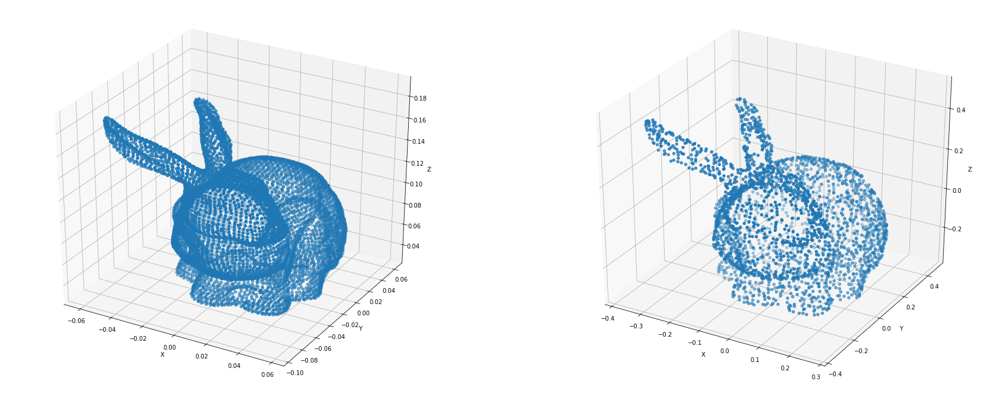

In [ ]:
conejo_normalizado = points[0:-1:3]/np.max(points) #Cogí la mitad de los puntos del conejo porque si no se explota :(
    
conejo_normalizado = conejo_normalizado - np.mean(conejo_normalizado,0)

fig = plt.figure(figsize=(30,12))

ax = fig.add_subplot(1, 2, 1, projection='3d', label='No normalizado')
X = points[:,0]
Y = points[:,1]
Z = points[:,2]
ax.scatter3D(Z,X,Y)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

ax = fig.add_subplot(1, 2, 2, projection='3d', label='Normalizado')
X = conejo_normalizado[:,0]
Y = conejo_normalizado[:,1]
Z = conejo_normalizado[:,2]
ax.scatter3D(Z,X,Y)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

plt.show()

En esta celda creo el dataset de varios conejitos rotados, con sus respectivos ángulos de rotación con respecto al original.

In [ ]:
conejos=[]
angulos=[]

for angle_x in np.arange(0,np.pi,0.1): #Cogí pasos de 0.1 radianes porque si no se explota otra vez :(
  for angle_y in np.arange(0,np.pi,0.1):
    for angle_z in np.arange(0,np.pi,0.1):

      conejo_rotado = np.dot(X_axis_rotation_matrix(angle_x),conejo_normalizado.T).T
      conejo_rotado = np.dot(Y_axis_rotation_matrix(angle_y),conejo_rotado.T).T
      conejo_rotado = np.dot(Z_axis_rotation_matrix(angle_z),conejo_rotado.T).T

      conejos.append(conejo_rotado)
      angulos.append([angle_x, angle_y, angle_z])

print(len(conejos))
print(len(angulos))

32768
32768


Convierto las listas en numpy arrays.

In [ ]:
X = np.asarray(conejos).astype('float32')
Y = np.asarray(angulos).astype('float32')

print(X.shape)
print(Y.shape)

(32768, 2724, 3)
(32768, 3)


Imprimo 3 conejitos dentro del dataset para ver si realmente se encuentran rotados, tambien imprimo sus respectivos ángulos de rotación.

[0.0, 0.0, 0.0]
[1.6, 0.0, 0.0]
[3.1, 3.1, 3.1]


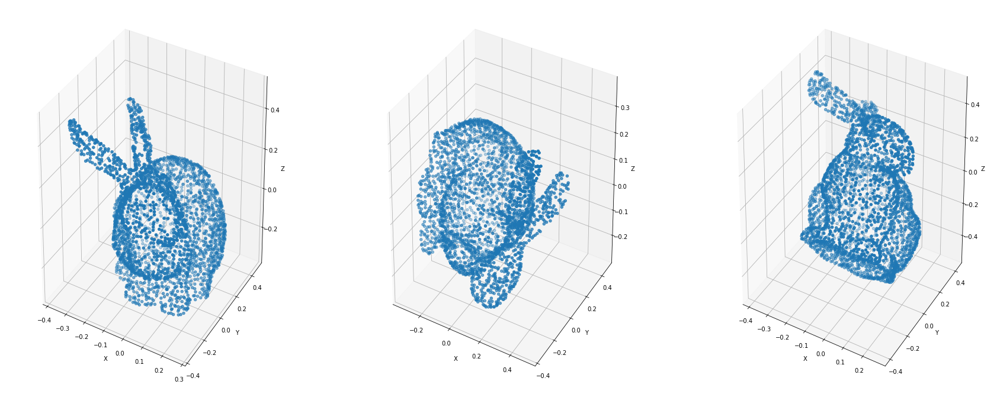

In [ ]:
fig = plt.figure(figsize=(30,12))
#Sin rotación
ax = fig.add_subplot(1, 3, 1, projection='3d', label='No normalizado')
ax.scatter3D(X[0,:,2], X[0,:,0], X[0,:,1])
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
print(angulos[0])
#El conejo de la mitad de entre todos los rotados
ax = fig.add_subplot(1, 3, 2, projection='3d', label='Normalizado')
ax.scatter3D(X[int(X.shape[0]/2),:,2], X[int(X.shape[0]/2),:,0], X[int(X.shape[0]/2),:,1])
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
print(angulos[int(X.shape[0]/2)])

#Ultimo conejito rotado
ax = fig.add_subplot(1, 3, 3, projection='3d', label='Normalizado')
#ax.scatter3D(X[X.shape[1]-1,:,2], X[X.shape[1]-1,:,0], X[X.shape[1]-1,:,1])
ax.scatter3D(X[-10,:,2], X[-10,:,0], X[-10,:,1])
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
print(angulos[-1])

plt.show()

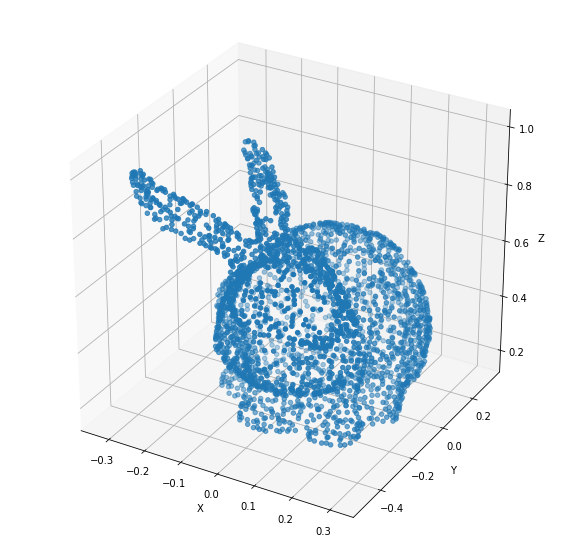

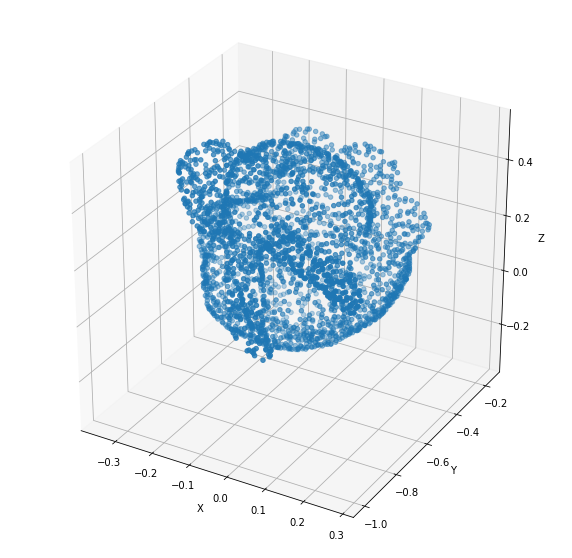

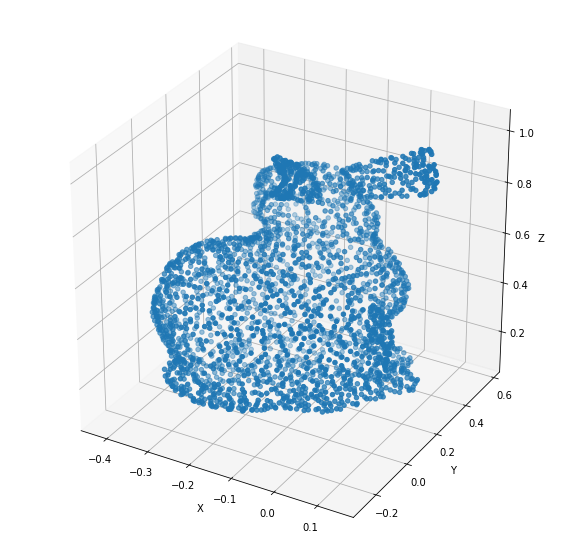

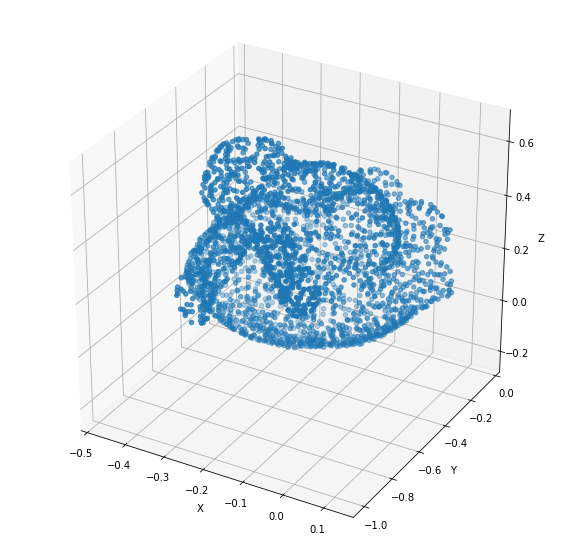

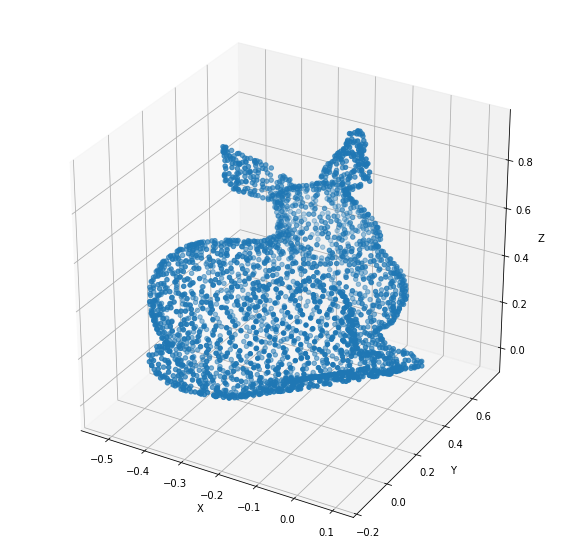

...

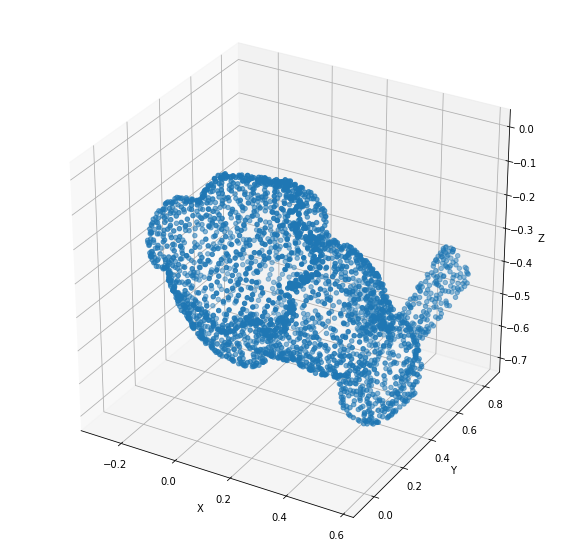

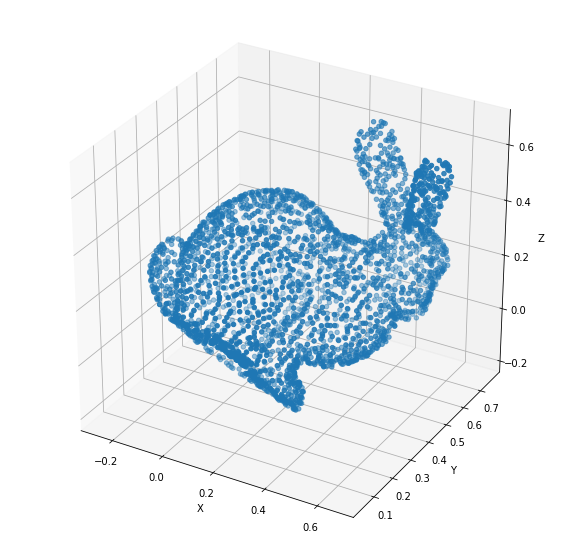

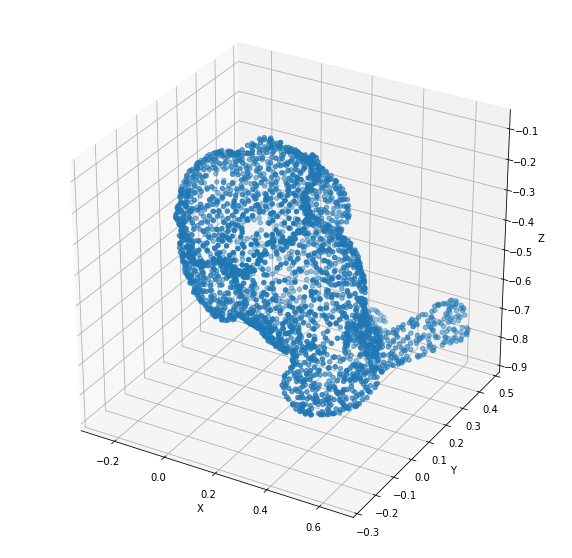

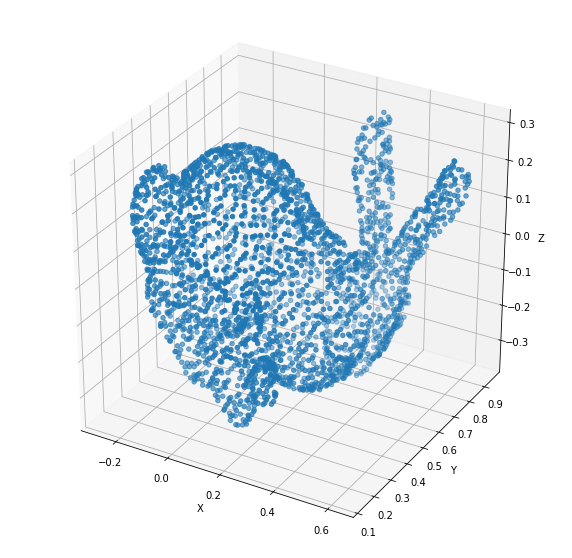

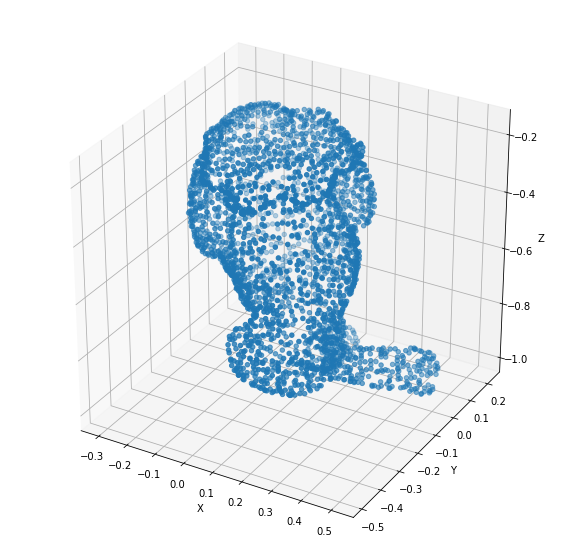

In [ ]:
for i in X[::2000]: #Recorro el dataset desde el inicio hasta el final en saltos de 2000 conejitos, osea imprime 16 conejitos

  fig = plt.figure(figsize=(10,10))
  
  ax = fig.add_subplot(1, 1, 1, projection='3d', label='No normalizado')
  ax.scatter3D(i[:,2], i[:,0], i[:,1])
  ax.set_xlabel('X')
  ax.set_ylabel('Y')
  ax.set_zlabel('Z')

  plt.show()


#**Red Neuronal:**

In [ ]:
#Separacion de datos de entrenamiento y test mediante la funcion split, con 20% para test
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2)

In [ ]:
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(26214, 2724, 3) (6554, 2724, 3) (26214, 3) (6554, 3)


In [ ]:
X_train = X_train.astype('float32')/np.max(X_train)
X_test = X_test.astype('float32')/ np.max(X_test)
y_train = y_train.astype('float32')
y_test = y_test.astype('float32')


In [ ]:
X_train.shape[1:]

(2724, 3)

##No ejecutar esto (entrenamiento del modelo)

In [ ]:
model =  tf.keras.Sequential([
                             tf.keras.layers.Flatten(input_shape=X_train.shape[1:]),
                             tf.keras.layers.Dense(1024, activation='tanh'),
                             tf.keras.layers.Dropout(0.5),
                             tf.keras.layers.Dense(512, activation='tanh'),
                             tf.keras.layers.Dropout(0.2),
                             tf.keras.layers.Dense(256, activation='tanh'),
                             tf.keras.layers.Dense(3)])

model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_1 (Flatten)          (None, 8172)              0         
_________________________________________________________________
dense_4 (Dense)              (None, 1024)              8369152   
_________________________________________________________________
dropout_2 (Dropout)          (None, 1024)              0         
_________________________________________________________________
dense_5 (Dense)              (None, 512)               524800    
_________________________________________________________________
dropout_3 (Dropout)          (None, 512)               0         
_________________________________________________________________
dense_6 (Dense)              (None, 256)               131328    
_________________________________________________________________
dense_7 (Dense)              (None, 3)                

In [ ]:
opt = tf.optimizers.SGD(learning_rate = 1e-2)
model.compile(optimizer=opt, loss='mse')
hist= model.fit(X_train, y_train, epochs=40, validation_data=(X_test, y_test))

Epoch 1/40
820/820 [==============================] - 6s 7ms/step - loss: 0.2867 - val_loss: 0.1382
Epoch 2/40
820/820 [==============================] - 6s 7ms/step - loss: 0.1300 - val_loss: 0.1056
Epoch 3/40
820/820 [==============================] - 6s 8ms/step - loss: 0.0992 - val_loss: 0.0882
Epoch 4/40
820/820 [==============================] - 6s 7ms/step - loss: 0.0821 - val_loss: 0.0544
Epoch 5/40
820/820 [==============================] - 6s 7ms/step - loss: 0.0727 - val_loss: 0.0501
Epoch 6/40
820/820 [==============================] - 6s 7ms/step - loss: 0.0658 - val_loss: 0.0464
Epoch 7/40
820/820 [==============================] - 6s 7ms/step - loss: 0.0599 - val_loss: 0.0477
Epoch 8/40
820/820 [==============================] - 5s 7ms/step - loss: 0.0552 - val_loss: 0.0357
Epoch 9/40
820/820 [==============================] - 5s 7ms/step - loss: 0.0518 - val_loss: 0.0342
Epoch 10/40
820/820 [==============================] - 5s 7ms/step - loss: 0.0494 - val_loss: 0.0313

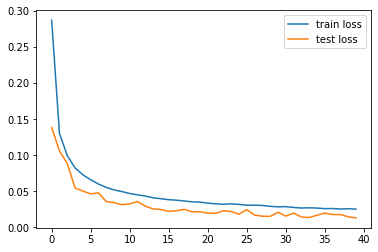

In [ ]:
import matplotlib.pyplot as plt
plt.plot(hist.history['loss'], label='train loss');
plt.plot(hist.history['val_loss'], label='test loss');
plt.legend()
plt.show();

In [ ]:
predictions = model.predict(X_test)
predictions.shape
#print(X_test[0][..., np.newaxis].T)
#print(X_test[:1])

(6554, 3)

(6554, 3)


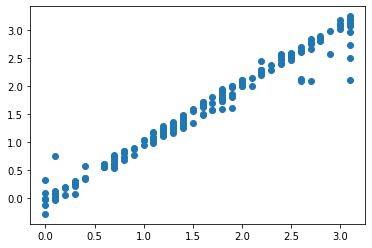

In [ ]:
#rotaciones en X predichas vs reales
print(predictions.shape)
plt.scatter(y_test[0:200,0],predictions[0:200,0],label='pred')
plt.show()

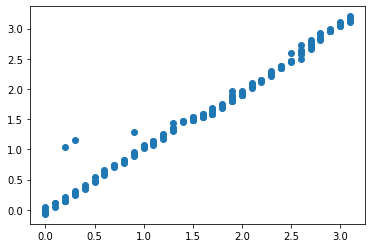

In [ ]:
#rotaciones en Y predichas vs reales
plt.scatter(y_test[0:200,1],pre#Separacion de datos de entrenamiento y test mediante la funcion split, con 20% para test
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2)dictions[0:200,1],label='pred')
plt.show()

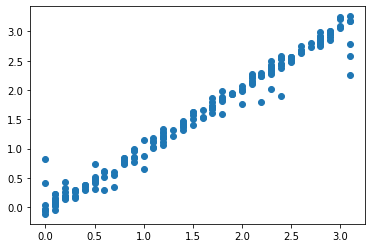

In [ ]:
#rotaciones en Z predichas vs reales
plt.scatter(y_test[0:200,2],predictions[0:200,2],label='pred')
plt.show()

In [ ]:
!pwd

/content/drive/.shortcut-targets-by-id/1asBEAN-S2b77S-W1swprmpEcUXwsqzS3/PROYECTO DE GRADO/Code


In [ ]:
model.save('/Models/modelo_predAng_3d.h5')

##Ejecutar Esto (cargar el modelo ya entrenado)




In [ ]:
new_model = tf.keras.models.load_model('/Models/modelo_predAng_3d.h5')


In [ ]:
predictions = new_model.predict(X_test)
predictions.shape

(6554, 3)

(6554, 3)


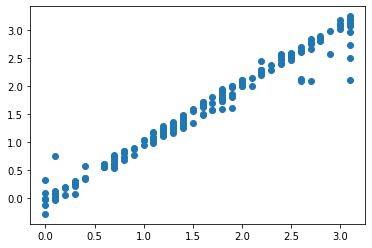

In [ ]:
#rotaciones en X predichas vs reales
print(predictions.shape)
plt.scatter(y_test[0:200,0],predictions[0:200,0],label='pred')
plt.show()

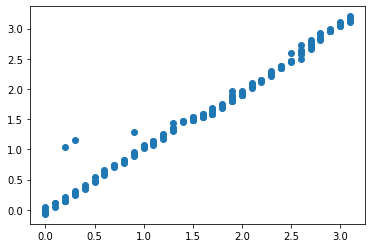

In [ ]:
#rotaciones en Y predichas vs reales
plt.scatter(y_test[0:200,1],predictions[0:200,1],label='pred')
plt.show()

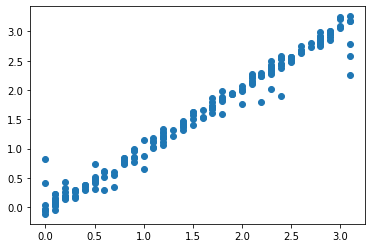

In [ ]:
#rotaciones en Z predichas vs reales
plt.scatter(y_test[0:200,2],predictions[0:200,2],label='pred')
plt.show()

#**Ensamble de nubes**

Superposición de solo un conejo conejos.

(2724, 3)
(1, 2724, 3)
1.4505408843660474 1.5095735074699177 0.3689607032880423
[[1.688387  1.4350832 0.6686667]]


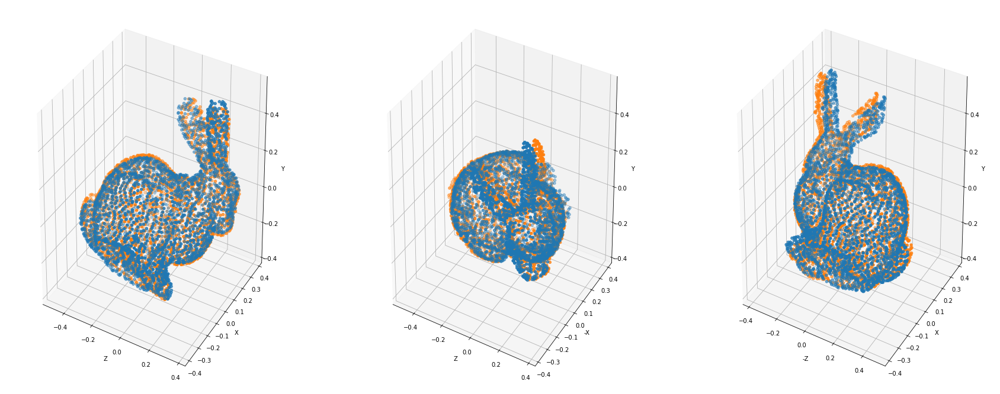

array([[[-0.05399601,  0.17981416, -0.02224807],
        [ 0.13600007,  0.19444096,  0.07122207],
        [-0.05442627,  0.17751563, -0.03983968],
        ...,
        [-0.09090339,  0.28268433, -0.03870897],
        [-0.22371416,  0.2692147 , -0.13759904],
        [-0.1398503 ,  0.26178342, -0.04831474]]], dtype=float32)

In [ ]:
#Puntos del conejo original centrado en el origen.
pts_original = conejo_normalizado
print(pts_original.shape)

fig = plt.figure(figsize=(30,12))

#Generamos ángulos aleatorios para hacer esa rotación.
random_rotation_X=np.random.random()*np.pi
random_rotation_Y=np.random.random()*np.pi
random_rotation_Z=np.random.random()*np.pi

Test=np.dot(X_axis_rotation_matrix(random_rotation_X),pts_original.T).T
Test=np.dot(Y_axis_rotation_matrix(random_rotation_Y),Test.T).T
Test=np.dot(Z_axis_rotation_matrix(random_rotation_Z),Test.T).T

Test = Test[np.newaxis, ...]
print(Test.shape)

y_pred = model.predict(Test)

print(random_rotation_X, random_rotation_Y, random_rotation_Z)
print(y_pred)

Pred = np.dot(X_axis_rotation_matrix(y_pred[0,0]),pts_original.T).T
Pred = np.dot(Y_axis_rotation_matrix(y_pred[0,1]),Pred.T).T
Pred = np.dot(Z_axis_rotation_matrix(y_pred[0,2]),Pred.T).T

ax = fig.add_subplot(1, 3, 1, projection='3d', label='No normalizado')
ax.set_xlabel('Z')
ax.set_ylabel('X')
ax.set_zlabel('Y')
ax.scatter3D(Test[0,:,2],Test[0,:,0], Test[0,:,1])
ax.scatter3D(Pred[:,2], Pred[:,0], Pred[:,1])

ax = fig.add_subplot(1, 3, 2, projection='3d', label='No normalizado')
ax.set_xlabel('Z')
ax.set_ylabel('-X')
ax.set_zlabel('Y')
ax.scatter3D(Test[0,:,2], -Test[0,:,0], Test[0,:,1])
ax.scatter3D(Pred[:,2], -Pred[:,0], Pred[:,1])

ax = fig.add_subplot(1, 3, 3, projection='3d', label='No normalizado')
ax.set_xlabel('-Z')
ax.set_ylabel('X')
ax.set_zlabel('Y')
ax.scatter3D(-Test[0,:,2],Test[0,:,0], Test[0,:,1])
ax.scatter3D(-Pred[:,2], Pred[:,0], Pred[:,1])

plt.show()

X[:1]

(2724, 3)


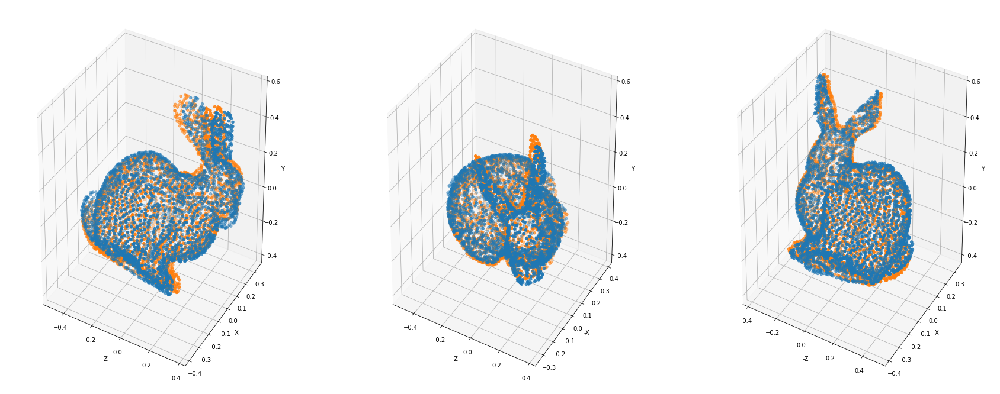

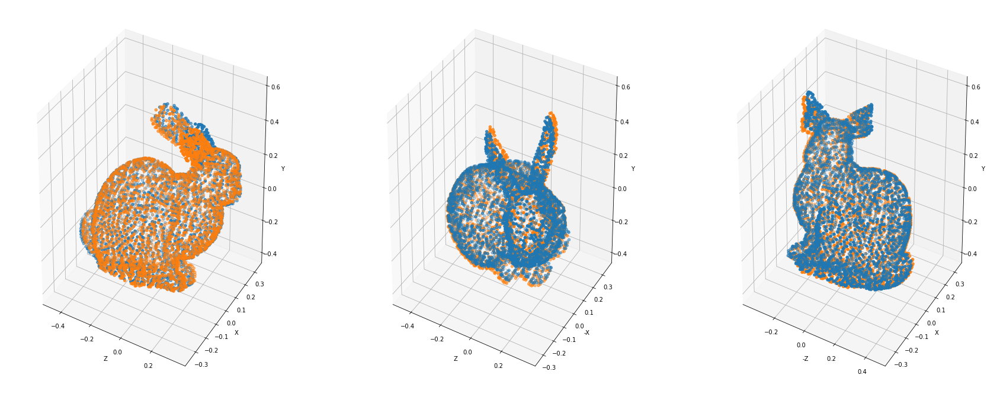

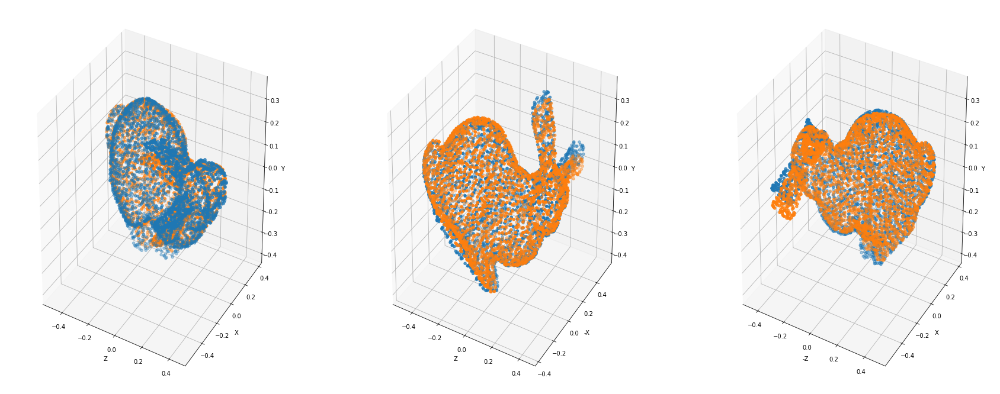

In [ ]:
pts_original = conejo_normalizado
print(pts_original.shape)

for i in range(3):

  fig = plt.figure(figsize=(30,12))

  random_rotation_X=np.random.random()*np.pi
  random_rotation_Y=np.random.random()*np.pi
  random_rotation_Z=np.random.random()*np.pi

  Test=np.dot(X_axis_rotation_matrix(random_rotation_X),pts_original.T).T
  Test=np.dot(Y_axis_rotation_matrix(random_rotation_Y),Test.T).T
  Test=np.dot(Z_axis_rotation_matrix(random_rotation_Z),Test.T).T

  Test = Test[np.newaxis, ...]

  y_pred = model.predict(Test)

  Pred = np.dot(X_axis_rotation_matrix(y_pred[0,0]),pts_original.T).T
  Pred = np.dot(Y_axis_rotation_matrix(y_pred[0,1]),Pred.T).T
  Pred = np.dot(Z_axis_rotation_matrix(y_pred[0,2]),Pred.T).T

  ax = fig.add_subplot(1, 3, 1, projection='3d', label='No normalizado')
  ax.set_xlabel('Z')
  ax.set_ylabel('X')
  ax.set_zlabel('Y')
  ax.scatter3D(Test[0,:,2],Test[0,:,0], Test[0,:,1])
  ax.scatter3D(Pred[:,2], Pred[:,0], Pred[:,1])

  ax = fig.add_subplot(1, 3, 2, projection='3d', label='No normalizado')
  ax.set_xlabel('Z')
  ax.set_ylabel('-X')
  ax.set_zlabel('Y')
  ax.scatter3D(Test[0,:,2], -Test[0,:,0], Test[0,:,1])
  ax.scatter3D(Pred[:,2], -Pred[:,0], Pred[:,1])

  ax = fig.add_subplot(1, 3, 3, projection='3d', label='No normalizado')
  ax.set_xlabel('-Z')
  ax.set_ylabel('X')
  ax.set_zlabel('Y')
  ax.scatter3D(-Test[0,:,2],Test[0,:,0], Test[0,:,1])
  ax.scatter3D(-Pred[:,2], Pred[:,0], Pred[:,1])

  plt.show()
